In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import seaborn as sns
import scvi
import math
import matplotlib.pyplot as plt
import scipy.sparse
from glob import glob
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression

%matplotlib inline

Global seed set to 0


In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.1 anndata==0.8.0 umap==0.5.2 numpy==1.21.6 scipy==1.9.0 pandas==1.4.3 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.9.9 pynndescent==0.5.6


In [3]:
adata = sc.read_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/highpass/eb_pflog1ppfnorm.cellid_annotated.filtered.h5ad")

## Filter Samples

How many cells do we have for each individual in each cell type?

In [4]:
cell_counts = adata.obs[['donor_id', 'cellid_label']]
cell_counts = pd.DataFrame(cell_counts.groupby('cellid_label').value_counts()).reset_index(inplace=False).rename(columns={0: "n_cells_unfiltered", 'cellid_label': 'type'})
cell_counts

,type,donor_id,n_cells_unfiltered
0,Acinar cells,NA18511,2277
1,Acinar cells,NA18858,1932
2,Acinar cells,NA19160,1928
3,Acinar cells,NA18856,1887
4,Acinar cells,NA18505,1788
...,...,...,...
1744,Vascular endothelial cells,NA19193,1
1745,Vascular endothelial cells,NA18520,1
1746,Vascular endothelial cells,NA19209,0
1747,Vascular endothelial cells,NA19101,0


To get this into proper form, we need to:
- Reformat cell types

In [5]:
cell_counts['individual'] = [s.replace("NA", "") for s in cell_counts['donor_id']]
cell_counts['ind_type'] = cell_counts['individual'].astype(str) + "_" + cell_counts['type'].astype(str)
cell_counts = cell_counts[['ind_type', 'individual', 'type', 'n_cells_unfiltered']]
cell_counts

,ind_type,individual,type,n_cells_unfiltered
0,18511_Acinar cells,18511,Acinar cells,2277
1,18858_Acinar cells,18858,Acinar cells,1932
2,19160_Acinar cells,19160,Acinar cells,1928
3,18856_Acinar cells,18856,Acinar cells,1887
4,18505_Acinar cells,18505,Acinar cells,1788
...,...,...,...,...
1744,19193_Vascular endothelial cells,19193,Vascular endothelial cells,1
1745,18520_Vascular endothelial cells,18520,Vascular endothelial cells,1
1746,19209_Vascular endothelial cells,19209,Vascular endothelial cells,0
1747,19101_Vascular endothelial cells,19101,Vascular endothelial cells,0


We'll drop any samples with less than 5 cells

In [6]:
cell_counts['dropped'] = cell_counts['n_cells_unfiltered'] < 5

## Filter Cell Types

We will filter to samples with at least 5 cells, and cell types with over 25 individuals represented.

In [7]:
ind_counts = cell_counts[cell_counts['n_cells_unfiltered'] >= 5]
ind_counts = pd.DataFrame(ind_counts[['type']].value_counts()).reset_index(inplace=False).rename(columns={0: "n_unfiltered"})
ind_counts = ind_counts[ind_counts['n_unfiltered']>25]
ind_counts

,type,n_unfiltered
0,Acinar cells,53
1,CNS glia,53
2,CNS neurons,53
3,Ciliated epithelial cells,53
4,Erythroblasts,53
5,Metanephric cells,53
6,Retinal cells,52
7,Ductal cells,52
8,PNS glia,52
9,Neuroendocrine cells,52


In [9]:
ind_counts.to_csv("/project2/gilad/jpopp/ebQTL/data/static/eb_cellid/pseudobulk_tmm/samples_per_celltype.tsv",
                  sep="\t", index=False)

## Pseudobulk Aggregation

First, we can highlight which samples will be kept for QTL analysis

In [10]:
cell_types_inc = ind_counts['type']
samples_inc = cell_counts[(cell_counts['dropped'] == False) & (cell_counts['type'].isin(cell_types_inc))]['ind_type']

In [11]:
cell_subset = adata.obs[['donor_id']]
cell_subset['type'] = adata.obs[['cellid_label']]
cell_subset['ind'] = [s.replace("NA", "") for s in cell_subset['donor_id'].astype(str)]
cell_subset['sample'] = cell_subset['ind'] + "_" + cell_subset['type']
cell_subset = cell_subset[cell_subset['sample'].isin(samples_inc)]
cell_subset

/tmp/jobs/25920387/ipykernel_14832/1675977317.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cell_subset['type'] = adata.obs[['cellid_label']]
/tmp/jobs/25920387/ipykernel_14832/1675977317.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cell_subset['ind'] = [s.replace("NA", "") for s in cell_subset['donor_id'].astype(str)]
/tmp/jobs/25920387/ipykernel_14832/1675977317.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

,donor_id,type,ind,sample
cell,,,,
AAACCCACAGAAGTGC-1,NA18870,Retinal cells,18870,18870_Retinal cells
AAACGAAAGGTATTGA-1,NA18870,CNS neurons,18870,18870_CNS neurons
AAACGCTAGCAGGTCA-1,NA18870,PNS glia,18870,18870_PNS glia
AAACGCTAGTCACTCA-1,NA18913,Metanephric cells,18913,18913_Metanephric cells
AAACGCTGTAGCCAGA-1,NA18870,CNS neurons,18870,18870_CNS neurons
...,...,...,...,...
TTTGATCAGGTGATCG-118,NA18511,Acinar cells,18511,18511_Acinar cells
TTTGATCGTCGCGTTG-118,NA19160,Erythroblasts,19160,19160_Erythroblasts
TTTGATCTCACGTCCT-118,NA18511,Erythroblasts,18511,18511_Erythroblasts


For pseudobulk aggregation, we're going to use the raw data

In [12]:
adata.X = adata.layers['counts']
adata = adata[cell_subset.index]

Text(0.5, 1.0, 'N Genes By Counts')

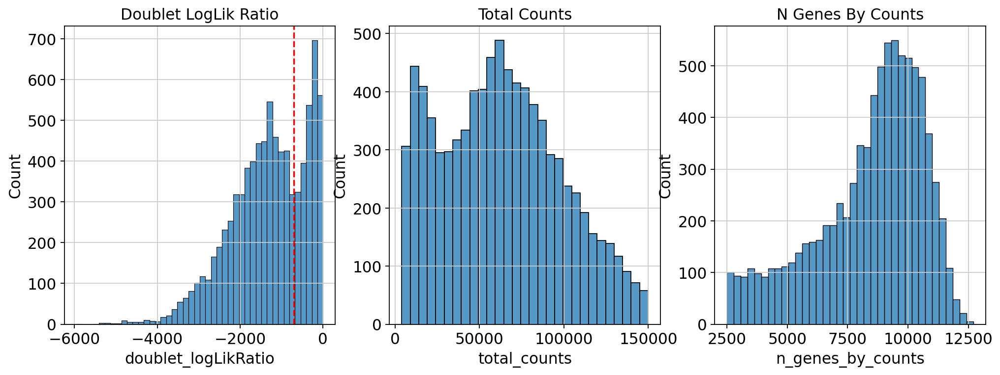

In [57]:
doublet_nll_cutoff = -700
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=False)

sns.histplot(ax=axes[0], x=mesendo_adata.obs['doublet_logLikRatio'])
axes[0].axvline(doublet_nll_cutoff, color='r', linestyle='--')
axes[0].set_title('Doublet LogLik Ratio')

sns.histplot(ax=axes[1], x=mesendo_adata.obs['total_counts'])
axes[1].set_title('Total Counts')

sns.histplot(ax=axes[2], x=mesendo_adata.obs['n_genes_by_counts'])
axes[2].set_title('N Genes By Counts')

In [58]:
mesendo_filt = mesendo_adata[mesendo_adata.obs['doublet_logLikRatio'] <= doublet_nll_cutoff]

Text(0.5, 1.0, 'N Genes By Counts')

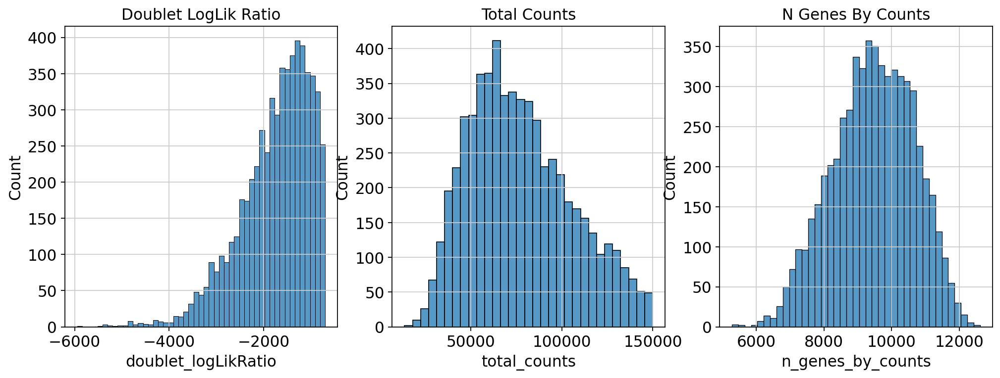

In [59]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=False)

sns.histplot(ax=axes[0], x=mesendo_filt.obs['doublet_logLikRatio'])
axes[0].set_title('Doublet LogLik Ratio')

sns.histplot(ax=axes[1], x=mesendo_filt.obs['total_counts'])
axes[1].set_title('Total Counts')

sns.histplot(ax=axes[2], x=mesendo_filt.obs['n_genes_by_counts'])
axes[2].set_title('N Genes By Counts')

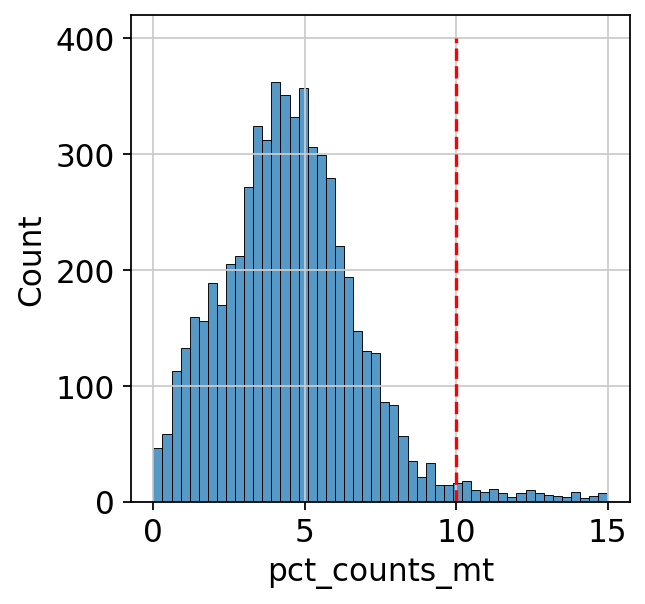

In [60]:
sns.histplot(mesendo_filt.obs['pct_counts_mt'])
plt.plot([10, 10], [0, 400], 'r--')

In [61]:
mesendo_filt = mesendo_filt[mesendo_filt.obs['pct_counts_mt'] < 10]

In [62]:
sc.pp.highly_variable_genes(mesendo_filt, layer='counts', n_top_genes=1000, flavor='seurat_v3', subset=False)
mesendo_filt.X = mesendo_filt.layers['data']
sc.pp.scale(mesendo_filt)
mesendo_filt.layers['scaled'] = mesendo_filt.X
sc.tl.score_genes(mesendo_filt, gene_list=mesendo_genes, score_name='mesendo_score')
sc.tl.score_genes_cell_cycle(mesendo_filt, s_genes=s_genes, g2m_genes=g2m_genes)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/contextlib.py:126: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'mesendo_score'
    finished: added
    'mesendo_score', score of gene set (adata.obs).
    300 total control genes are used. (0:00:01)
calculating cell cycle phase
computing score 'S_score'


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'S_score', score of gene set (adata.obs).
    558 total control genes are used. (0:00:01)
computing score 'G2M_score'


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'G2M_score', score of gene set (adata.obs).
    512 total control genes are used. (0:00:01)
-->     'phase', cell cycle phase (adata.obs)


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


Text(0.5, 1.0, 'G2M Score')

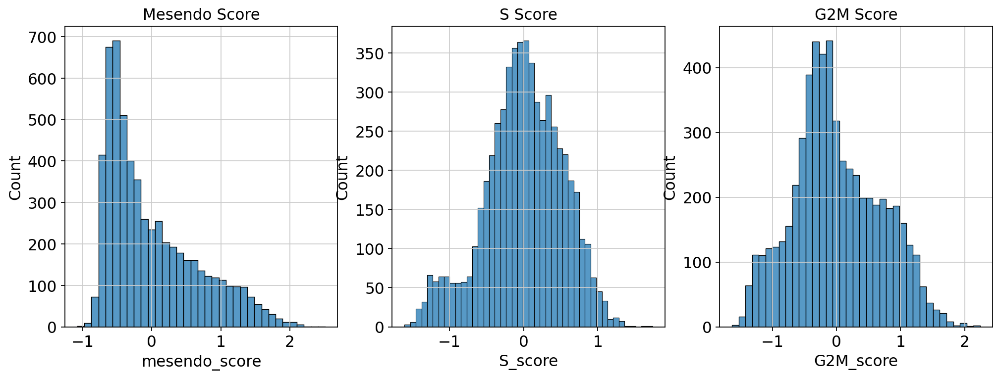

In [63]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=False)

sns.histplot(ax=axes[0], x=mesendo_filt.obs['mesendo_score'])
axes[0].set_title('Mesendo Score')

sns.histplot(ax=axes[1], x=mesendo_filt.obs['S_score'])
axes[1].set_title('S Score')

sns.histplot(ax=axes[2], x=mesendo_filt.obs['G2M_score'])
axes[2].set_title('G2M Score')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)


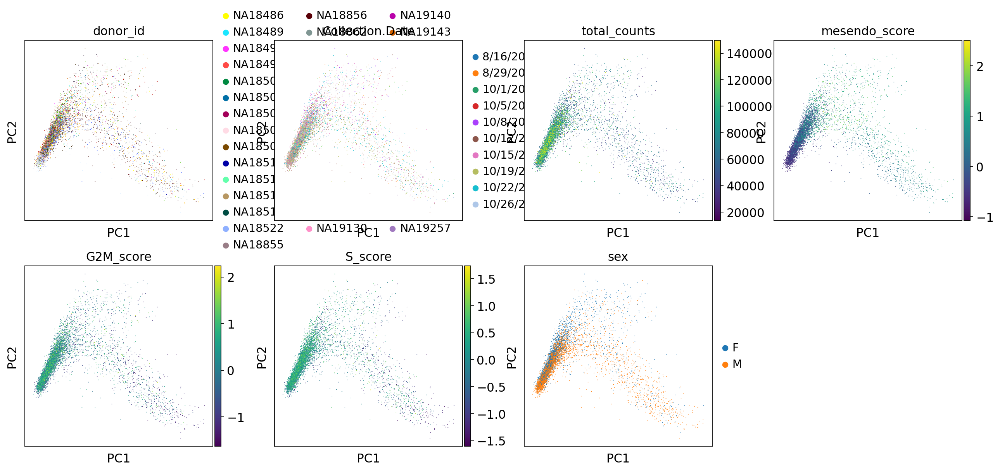

In [64]:
sc.pp.pca(mesendo_filt)
sc.pl.pca(mesendo_filt, color=['donor_id', 'Collection.Date', 'total_counts', 'mesendo_score', 'G2M_score', 'S_score', 'sex'],
         size=2.5, edgecolor='none')

/tmp/jobs/23172908/ipykernel_209754/4061029104.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_pd['intercept'] = 1
/tmp/jobs/23172908/ipykernel_209754/4061029104.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_pd['intercept'] = 1
/tmp/jobs/23172908/ipykernel_209754/4061029104.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pan

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5]),
 [Text(0, 0.5, 'donor_id'),
  Text(0, 1.5, 'Collection.Date'),
  Text(0, 2.5, 'total_counts'),
  Text(0, 3.5, 'mesendo_score'),
  Text(0, 4.5, 'G2M_score'),
  Text(0, 5.5, 'S_score'),
  Text(0, 6.5, 'sex')])

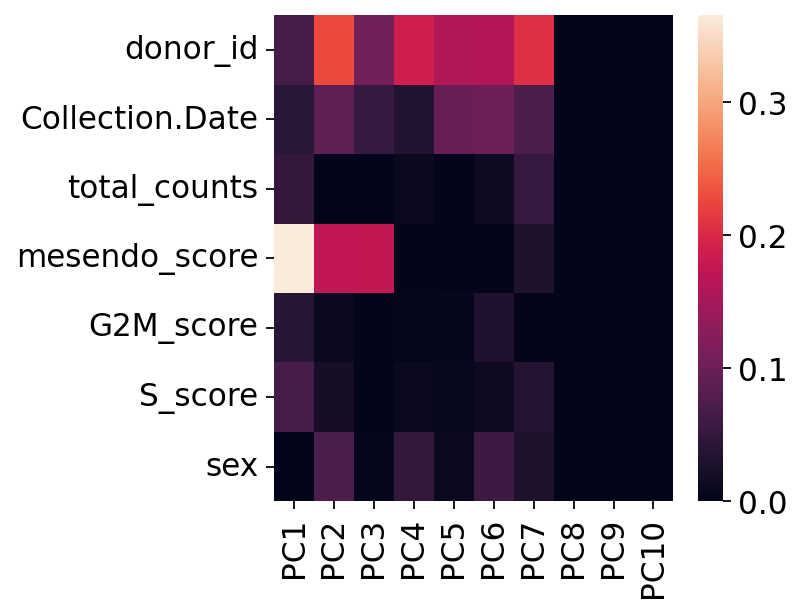

In [65]:
covariates = ['donor_id', 'Collection.Date', 'total_counts', 'mesendo_score', 'G2M_score', 'S_score', 'sex']
mat = np.zeros([len(covariates), 10])
for k in range(len(covariates)):
    if mesendo_filt.obs[covariates[k]].dtype.name == 'category':
        X_pd = mesendo_filt.obs[[covariates[k]]]
        X_pd['intercept'] = 1
        X = OneHotEncoder().fit(X_pd).transform(X_pd)
    else:
        X_pd = mesendo_filt.obs[[covariates[k]]]
        X_pd['intercept'] = 1
        X = X_pd.to_numpy()
    for pc in range(len(covariates)):
        y = mesendo_filt.obsm['X_pca'][:, pc]
        r2 = LinearRegression().fit(X, y).score(X, y)
        mat[k, pc] = r2
sns.heatmap(mat,
            xticklabels=['PC' + str(i) for i in range(1, 11)],
            yticklabels=covariates)
plt.yticks(rotation=0)

In [67]:
mesendo_keepers = mesendo_filt.obs.index

In [66]:
mesendo_filt.write_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/highpass/cm_lineage2-mesendo.h5ad")

In [68]:
meso_adata = scran_adata[scran_adata.obs['stage'] == 'meso']

Text(0.5, 1.0, 'N Genes By Counts')

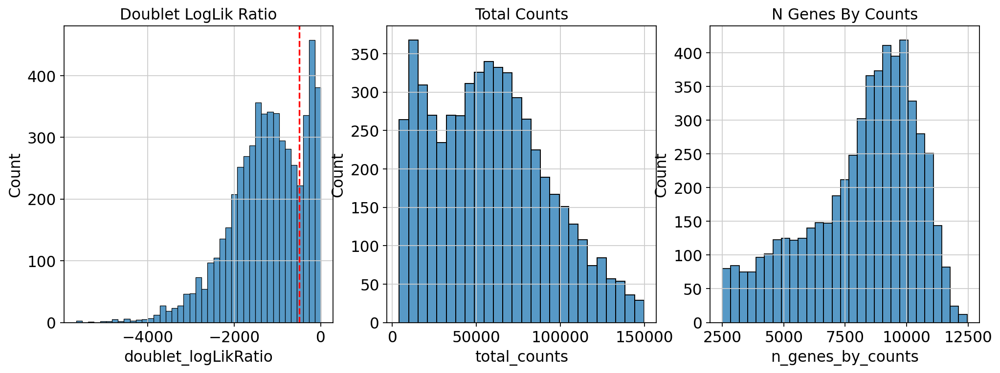

In [70]:
doublet_nll_cutoff = -500
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=False)

sns.histplot(ax=axes[0], x=meso_adata.obs['doublet_logLikRatio'])
axes[0].axvline(doublet_nll_cutoff, color='r', linestyle='--')
axes[0].set_title('Doublet LogLik Ratio')

sns.histplot(ax=axes[1], x=meso_adata.obs['total_counts'])
axes[1].set_title('Total Counts')

sns.histplot(ax=axes[2], x=meso_adata.obs['n_genes_by_counts'])
axes[2].set_title('N Genes By Counts')

In [71]:
meso_filt = meso_adata[meso_adata.obs['doublet_logLikRatio'] <= doublet_nll_cutoff]

Text(0.5, 1.0, 'N Genes By Counts')

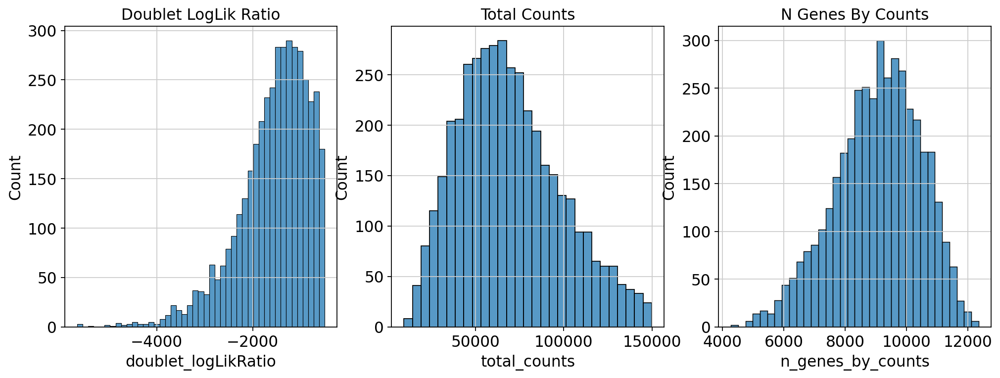

In [72]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=False)

sns.histplot(ax=axes[0], x=meso_filt.obs['doublet_logLikRatio'])
axes[0].set_title('Doublet LogLik Ratio')

sns.histplot(ax=axes[1], x=meso_filt.obs['total_counts'])
axes[1].set_title('Total Counts')

sns.histplot(ax=axes[2], x=meso_filt.obs['n_genes_by_counts'])
axes[2].set_title('N Genes By Counts')

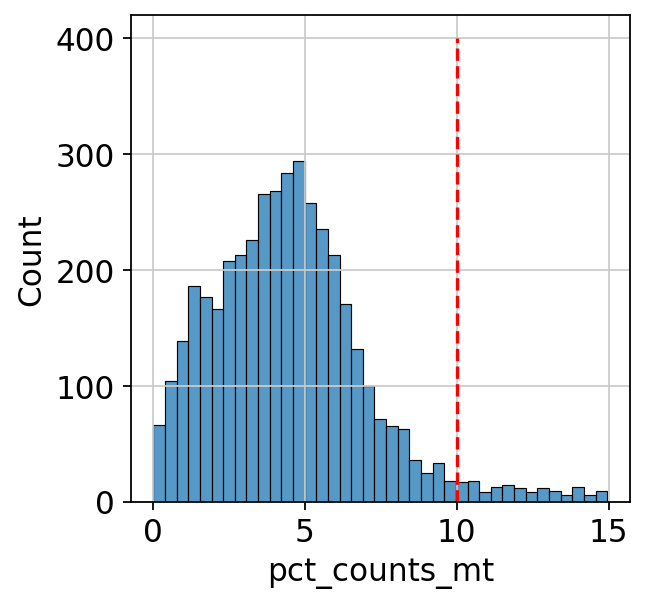

In [73]:
sns.histplot(meso_filt.obs['pct_counts_mt'])
plt.plot([10, 10], [0, 400], 'r--')

In [74]:
meso_filt = meso_filt[meso_filt.obs['pct_counts_mt'] < 10]

In [75]:
sc.pp.highly_variable_genes(meso_filt, layer='counts', n_top_genes=1000, flavor='seurat_v3', subset=False)
meso_filt.X = meso_filt.layers['data']
sc.pp.scale(meso_filt)
meso_filt.layers['scaled'] = meso_filt.X
sc.tl.score_genes(meso_filt, gene_list=mesoderm_genes, score_name='meso_score')
sc.tl.score_genes_cell_cycle(meso_filt, s_genes=s_genes, g2m_genes=g2m_genes)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/contextlib.py:126: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'meso_score'
    finished: added
    'meso_score', score of gene set (adata.obs).
    200 total control genes are used. (0:00:00)
calculating cell cycle phase
computing score 'S_score'


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'S_score', score of gene set (adata.obs).
    558 total control genes are used. (0:00:00)
computing score 'G2M_score'


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'G2M_score', score of gene set (adata.obs).
    515 total control genes are used. (0:00:00)
-->     'phase', cell cycle phase (adata.obs)


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


Text(0.5, 1.0, 'G2M Score')

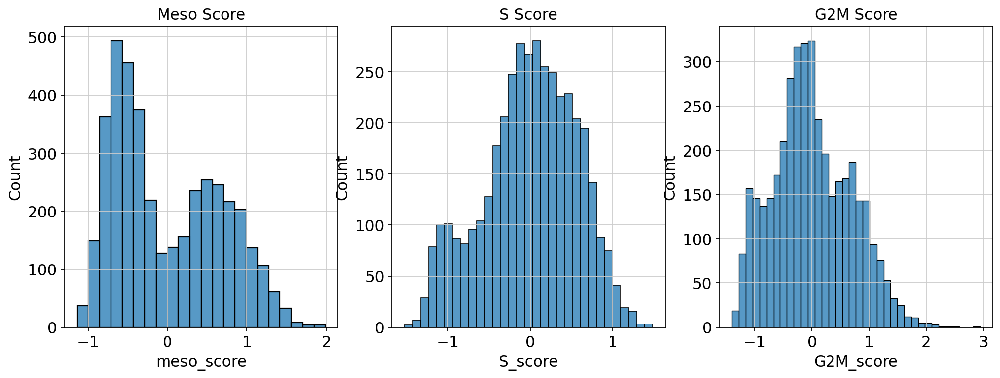

In [76]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=False)

sns.histplot(ax=axes[0], x=meso_filt.obs['meso_score'])
axes[0].set_title('Meso Score')

sns.histplot(ax=axes[1], x=meso_filt.obs['S_score'])
axes[1].set_title('S Score')

sns.histplot(ax=axes[2], x=meso_filt.obs['G2M_score'])
axes[2].set_title('G2M Score')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


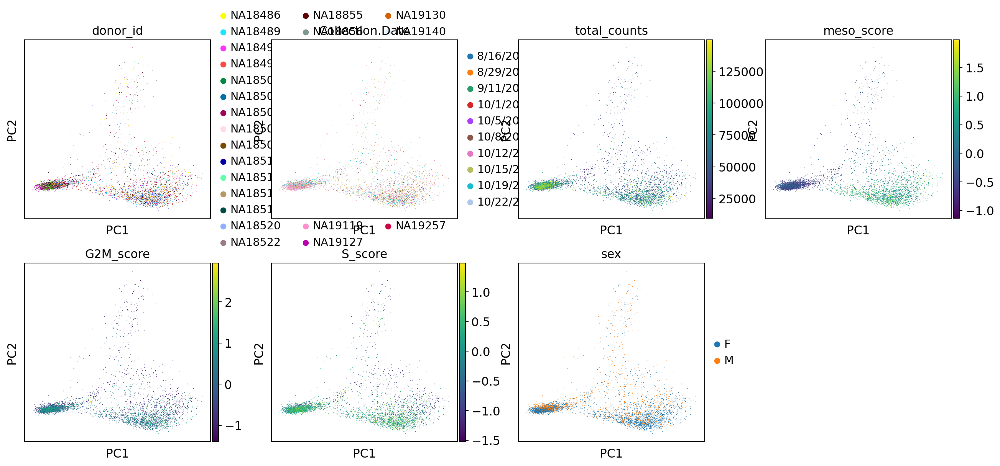

In [77]:
sc.pp.pca(meso_filt)
sc.pl.pca(meso_filt, color=['donor_id', 'Collection.Date', 'total_counts', 'meso_score', 'G2M_score', 'S_score', 'sex'],
         size=2.5, edgecolor='none')

Are these low-meso score cells totally irrelevant, or perhaps just on the border with mesendo or pluripotent cells?

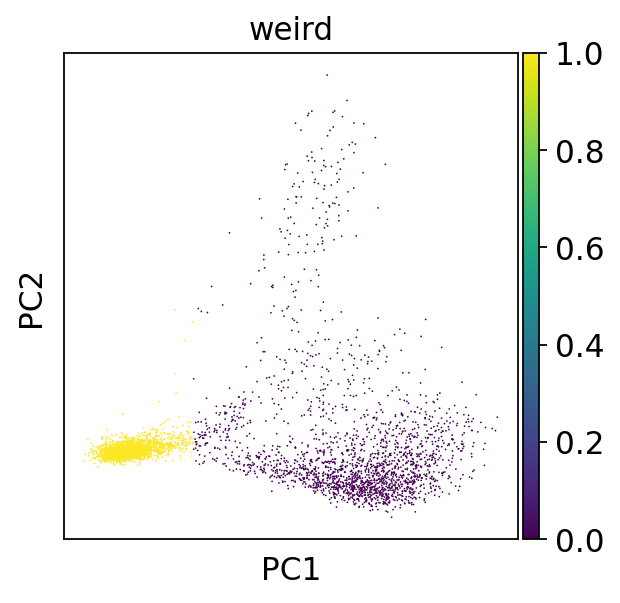

In [83]:
pc1 = meso_filt.obsm['X_pca'][:, 0]
meso_filt.obs['weird'] = (pc1 < -5).astype('int')
sc.pl.pca(meso_filt, color=['weird'], size=2.5)

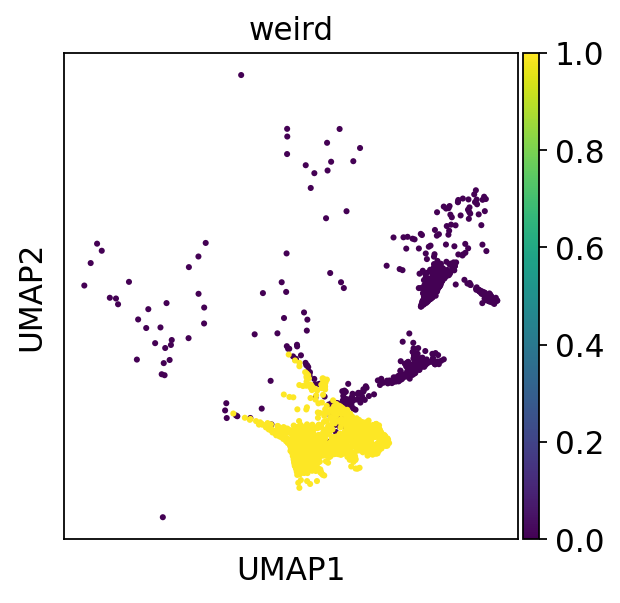

In [84]:
meso_filt.obsm['X_umap'] = radhika_adata[meso_filt.obs.index].obsm['X_umap']
sc.pl.umap(meso_filt, color='weird')

It looks like there are just a lot of pluripotent cells annotated as mesoderm, no need to remove those but it'd be helpful since I don't have all individuals represented in the pluripotent cells

/tmp/jobs/23172908/ipykernel_209754/1070461383.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_pd['intercept'] = 1
/tmp/jobs/23172908/ipykernel_209754/1070461383.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_pd['intercept'] = 1
/tmp/jobs/23172908/ipykernel_209754/1070461383.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pan

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5]),
 [Text(0, 0.5, 'donor_id'),
  Text(0, 1.5, 'Collection.Date'),
  Text(0, 2.5, 'total_counts'),
  Text(0, 3.5, 'meso_score'),
  Text(0, 4.5, 'G2M_score'),
  Text(0, 5.5, 'S_score'),
  Text(0, 6.5, 'sex')])

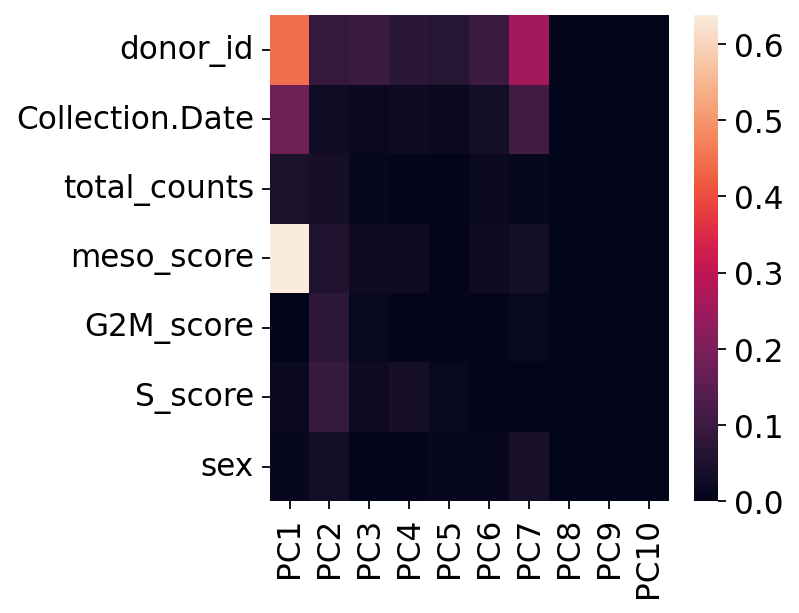

In [85]:
covariates = ['donor_id', 'Collection.Date', 'total_counts', 'meso_score', 'G2M_score', 'S_score', 'sex']
mat = np.zeros([len(covariates), 10])
for k in range(len(covariates)):
    if meso_filt.obs[covariates[k]].dtype.name == 'category':
        X_pd = meso_filt.obs[[covariates[k]]]
        X_pd['intercept'] = 1
        X = OneHotEncoder().fit(X_pd).transform(X_pd)
    else:
        X_pd = meso_filt.obs[[covariates[k]]]
        X_pd['intercept'] = 1
        X = X_pd.to_numpy()
    for pc in range(len(covariates)):
        y = meso_filt.obsm['X_pca'][:, pc]
        r2 = LinearRegression().fit(X, y).score(X, y)
        mat[k, pc] = r2
sns.heatmap(mat,
            xticklabels=['PC' + str(i) for i in range(1, 11)],
            yticklabels=covariates)
plt.yticks(rotation=0)

In [86]:
meso_keepers = meso_filt.obs.index

In [87]:
meso_filt.write_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/highpass/cm_lineage2-meso.h5ad")

In [88]:
cp_adata = scran_adata[scran_adata.obs['stage'] == 'cp']

Text(0.5, 1.0, 'N Genes By Counts')

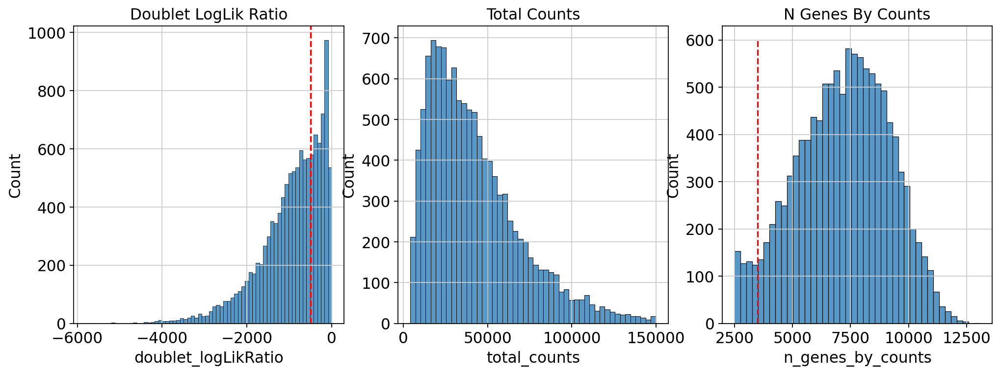

In [89]:
doublet_nll_cutoff = -500
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=False)

sns.histplot(ax=axes[0], x=cp_adata.obs['doublet_logLikRatio'])
axes[0].axvline(doublet_nll_cutoff, color='r', linestyle='--')
axes[0].set_title('Doublet LogLik Ratio')

sns.histplot(ax=axes[1], x=cp_adata.obs['total_counts'])
axes[1].set_title('Total Counts')

sns.histplot(ax=axes[2], x=cp_adata.obs['n_genes_by_counts'])
axes[2].set_title('N Genes By Counts')

In [90]:
cp_filt = cp_adata[cp_adata.obs['doublet_logLikRatio'] < doublet_nll_cutoff]

Text(0.5, 1.0, 'N Genes By Counts')

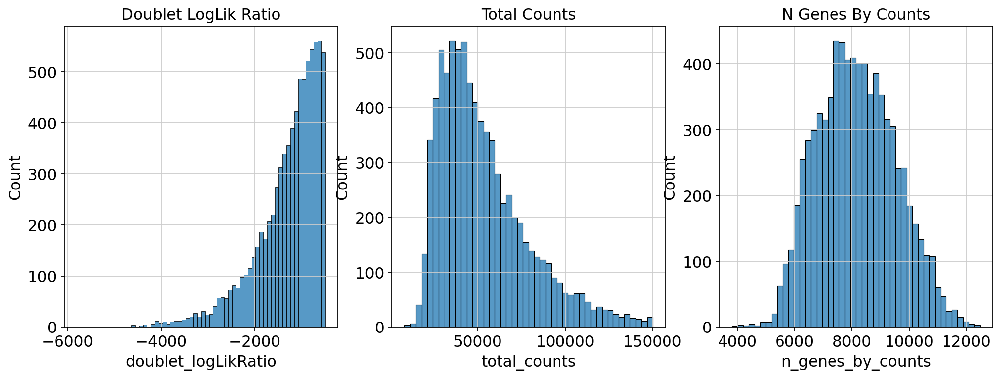

In [91]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=False)

sns.histplot(ax=axes[0], x=cp_filt.obs['doublet_logLikRatio'])
axes[0].set_title('Doublet LogLik Ratio')

sns.histplot(ax=axes[1], x=cp_filt.obs['total_counts'])
axes[1].set_title('Total Counts')

sns.histplot(ax=axes[2], x=cp_filt.obs['n_genes_by_counts'])
axes[2].set_title('N Genes By Counts')

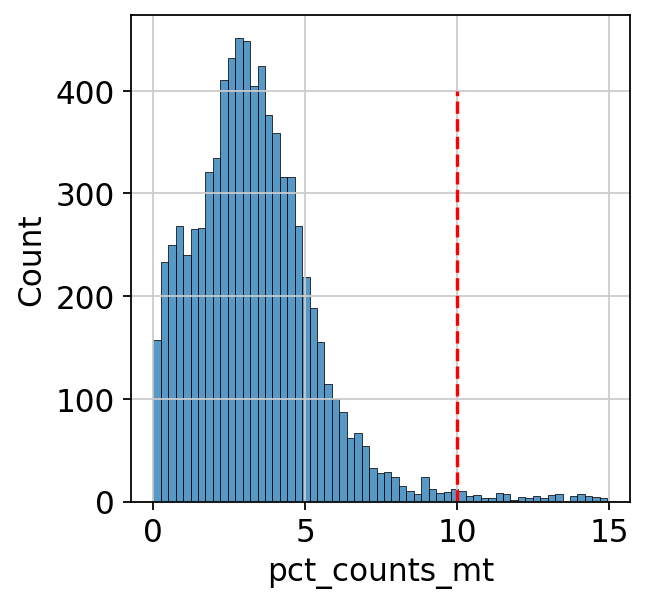

In [92]:
sns.histplot(cp_filt.obs['pct_counts_mt'])
plt.plot([10, 10], [0, 400], 'r--')

In [93]:
cp_filt = cp_filt[cp_filt.obs['pct_counts_mt'] < 10]

In [94]:
sc.pp.highly_variable_genes(cp_filt, layer='counts', n_top_genes=1000, flavor='seurat_v3', subset=False)
cp_filt.X = cp_filt.layers['data']
sc.pp.scale(cp_filt)
cp_filt.layers['scaled'] = cp_filt.X
sc.tl.score_genes(cp_filt, gene_list=progenitor_genes, score_name='cp_score')
sc.tl.score_genes_cell_cycle(cp_filt, s_genes=s_genes, g2m_genes=g2m_genes)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/contextlib.py:126: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'cp_score'
    finished: added
    'cp_score', score of gene set (adata.obs).
    400 total control genes are used. (0:00:01)
calculating cell cycle phase
computing score 'S_score'


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'S_score', score of gene set (adata.obs).
    686 total control genes are used. (0:00:01)
computing score 'G2M_score'


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'G2M_score', score of gene set (adata.obs).
    642 total control genes are used. (0:00:01)
-->     'phase', cell cycle phase (adata.obs)


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


Text(0.5, 1.0, 'G2M Score')

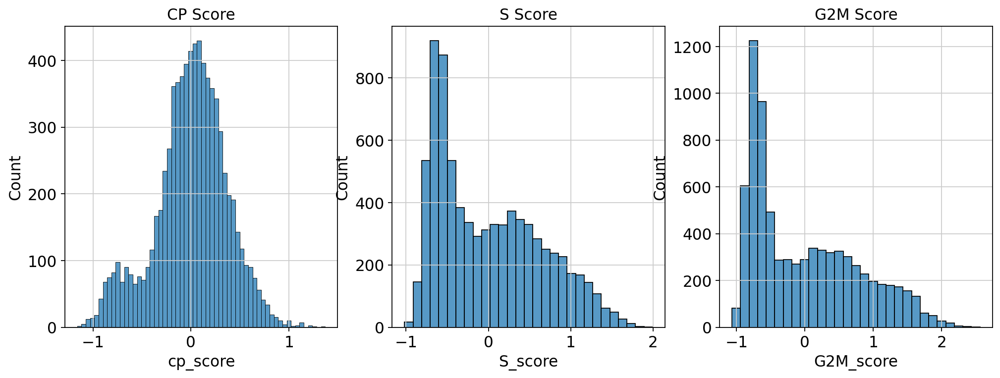

In [95]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=False)

sns.histplot(ax=axes[0], x=cp_filt.obs['cp_score'])
axes[0].set_title('CP Score')

sns.histplot(ax=axes[1], x=cp_filt.obs['S_score'])
axes[1].set_title('S Score')

sns.histplot(ax=axes[2], x=cp_filt.obs['G2M_score'])
axes[2].set_title('G2M Score')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


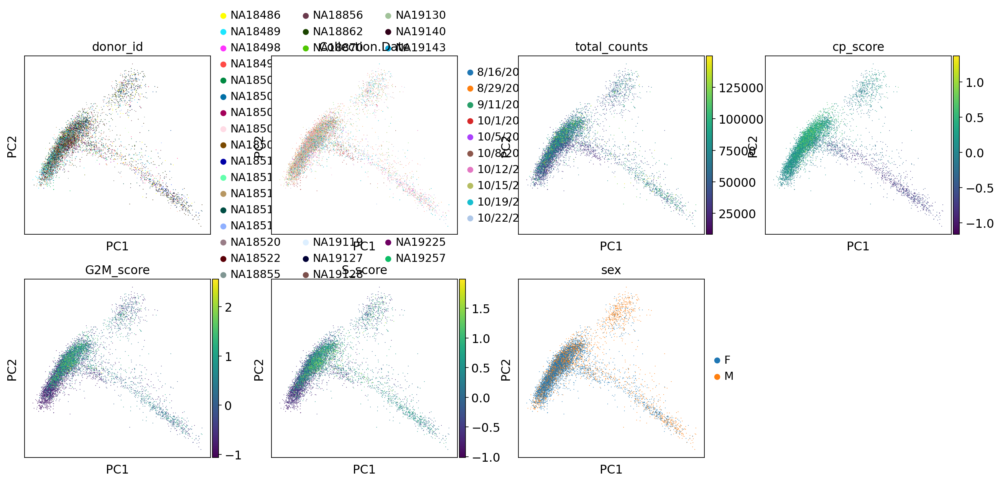

In [96]:
sc.pp.pca(cp_filt)
sc.pl.pca(cp_filt, color=['donor_id', 'Collection.Date', 'total_counts', 'cp_score', 'G2M_score', 'S_score', 'sex'],
         size=2.5, edgecolor='none')

How about here? Are those cells with especially low CP scores an unrelated cell type, or misannotated underdeveloped cells?

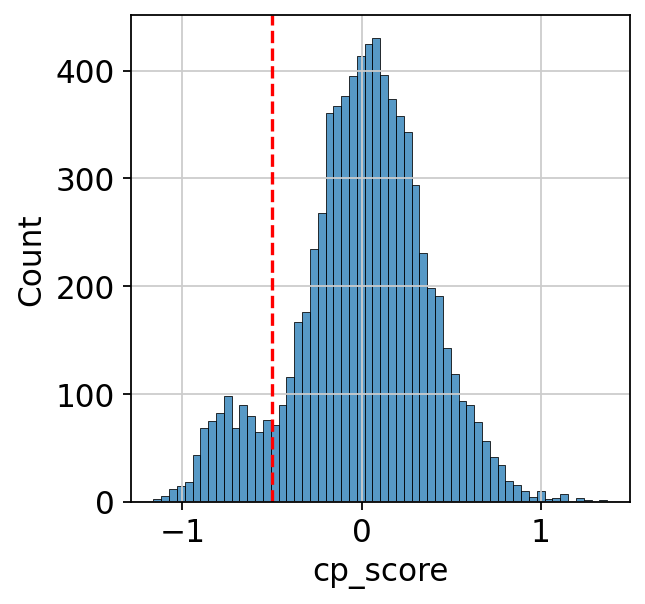

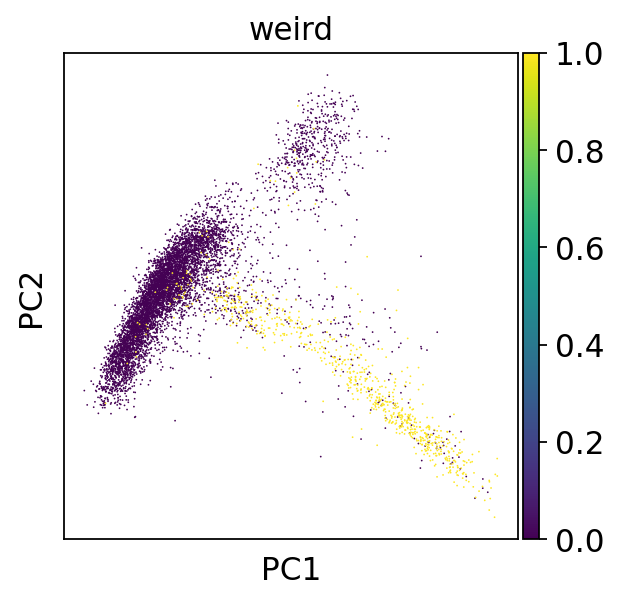

In [104]:
cp_score_cutoff = -0.5
cp_filt.obs['weird'] = (cp_filt.obs['cp_score'] < cp_score_cutoff).astype('int')

sns.histplot(x=cp_filt.obs['cp_score'])
plt.axvline(cp_score_cutoff, color='r', linestyle='--')

sc.pl.pca(cp_filt, color=['weird'], size=2.5)

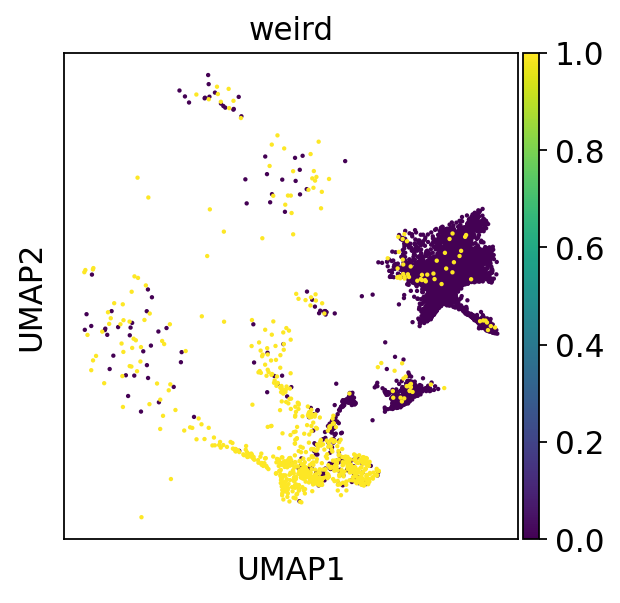

In [105]:
cp_filt.obsm['X_umap'] = radhika_adata[cp_filt.obs.index].obsm['X_umap']
sc.pl.umap(cp_filt, color='weird')

This time we're including quite a few of the ectoderm cell types, and a lot more pluripotent cells even though this should be a much later differentiation stage - I'm going to remove these cells.

In [106]:
cp_filt = cp_filt[cp_filt.obs['cp_score'] >= cp_score_cutoff]

/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


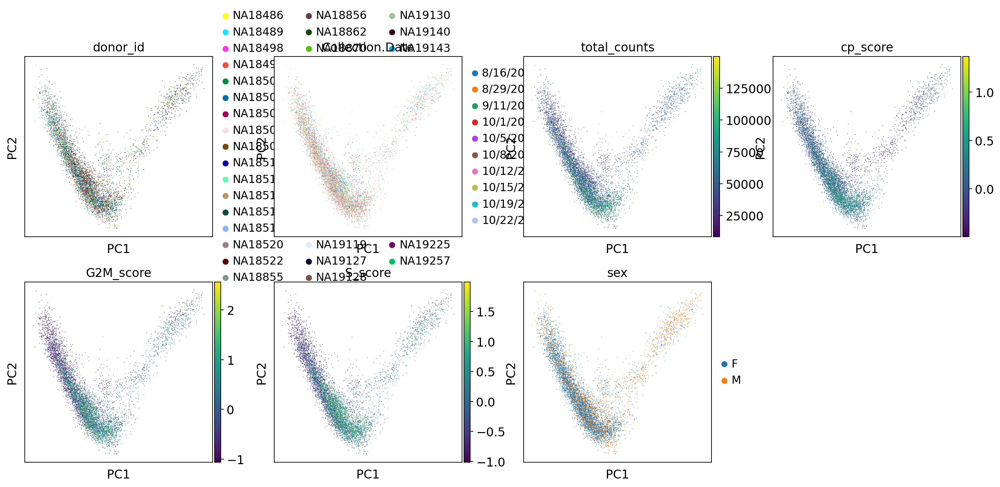

In [110]:
sc.pp.scale(cp_filt, layer='data')
cp_filt.layers['scaled'] = cp_filt.X
sc.pp.pca(cp_filt)
sc.pl.pca(cp_filt, color=['donor_id', 'Collection.Date', 'total_counts', 'cp_score', 'G2M_score', 'S_score', 'sex'],
         size=2.5, edgecolor='none')

There's still a bit of an offshoot here - what's going on?

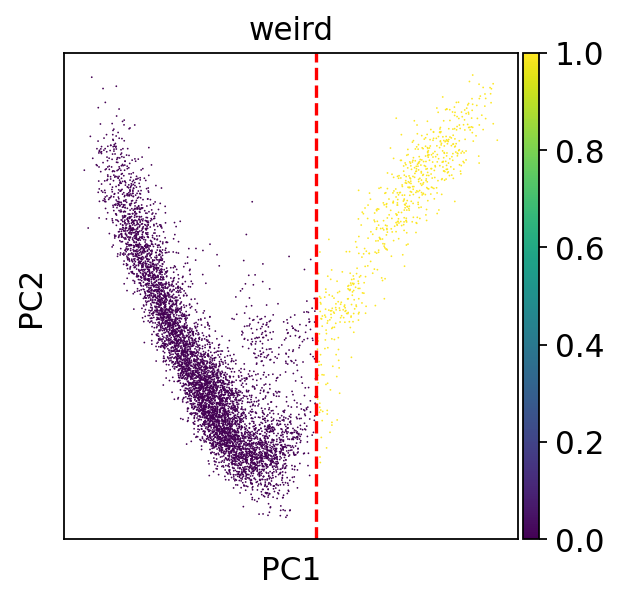

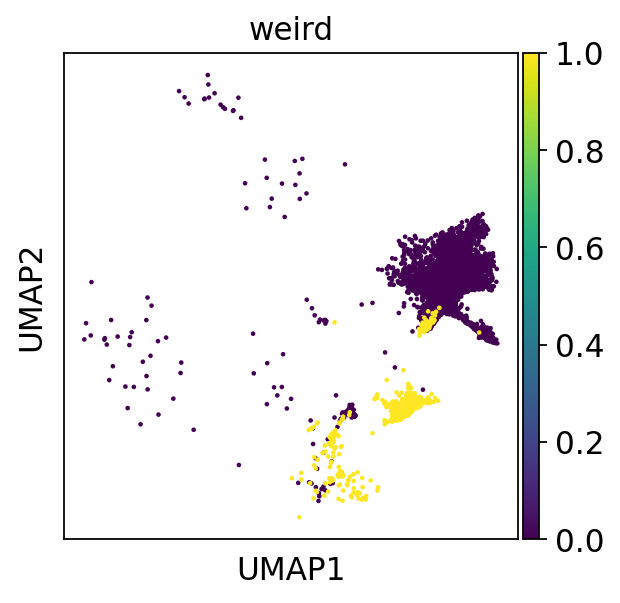

In [119]:
pc_cutoff = 10

pc1 = cp_filt.obsm['X_pca'][:, 0]
cp_filt.obs['weird'] = (pc1 > pc_cutoff).astype('int')

sc.pl.pca(cp_filt, color=['weird'], size=2.5, return_fig=True)
plt.axvline(pc_cutoff, color='r', linestyle='--')
sc.pl.umap(cp_filt, color='weird')

This one could go either way, do those cells actually have a reasonably high CP score?

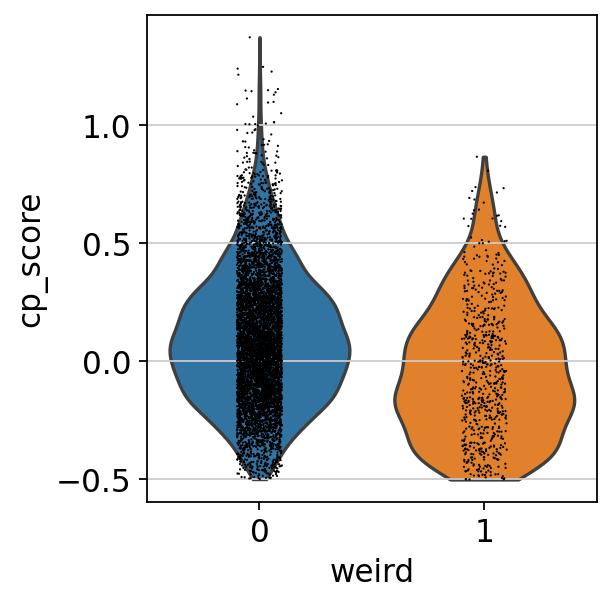

In [123]:
cp_filt.obs['weird'] = cp_filt.obs['weird'].astype('category')
sc.pl.violin(cp_filt, keys='cp_score', groupby='weird')

They're distinct from other cells, they aren't in the mesoderm cluster, and they don't have *especially* high CP scores, I'm going to remove them

In [124]:
cp_filt = cp_filt[cp_filt.obsm['X_pca'][:, 0] <= pc_cutoff]

/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:784: RuntimeWarning: invalid value encountered in sqrt
  std = np.sqrt(var)


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


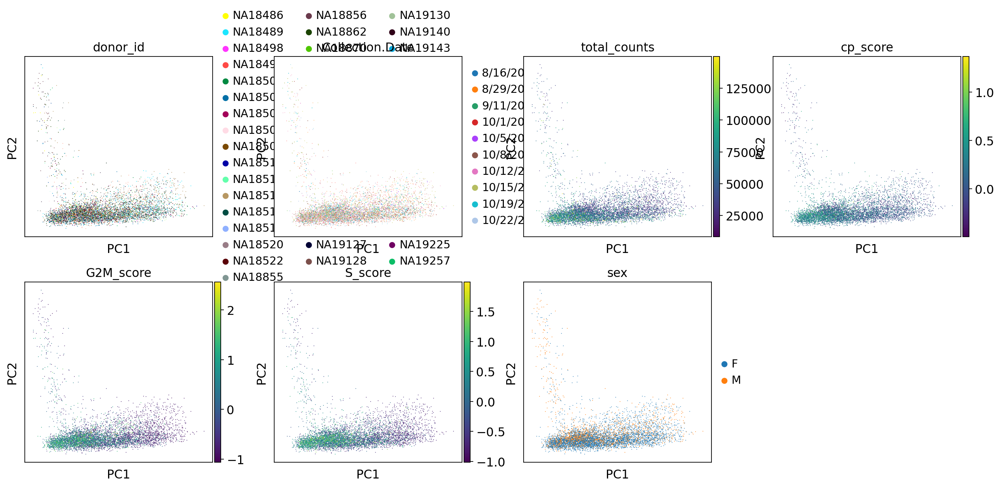

In [125]:
sc.pp.scale(cp_filt, layer='data')
cp_filt.layers['scaled'] = cp_filt.X
sc.pp.pca(cp_filt)
sc.pl.pca(cp_filt, color=['donor_id', 'Collection.Date', 'total_counts', 'cp_score', 'G2M_score', 'S_score', 'sex'],
         size=2.5, edgecolor='none')

/tmp/jobs/23172908/ipykernel_209754/2113794150.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_pd['intercept'] = 1
/tmp/jobs/23172908/ipykernel_209754/2113794150.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_pd['intercept'] = 1
/tmp/jobs/23172908/ipykernel_209754/2113794150.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pan

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5]),
 [Text(0, 0.5, 'donor_id'),
  Text(0, 1.5, 'Collection.Date'),
  Text(0, 2.5, 'total_counts'),
  Text(0, 3.5, 'cp_score'),
  Text(0, 4.5, 'G2M_score'),
  Text(0, 5.5, 'S_score'),
  Text(0, 6.5, 'sex')])

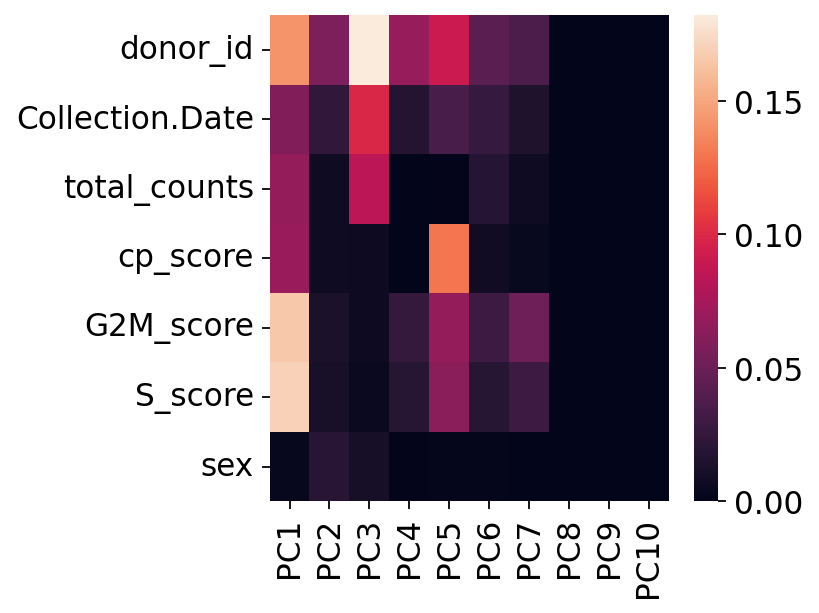

In [126]:
covariates = ['donor_id', 'Collection.Date', 'total_counts', 'cp_score', 'G2M_score', 'S_score', 'sex']
mat = np.zeros([len(covariates), 10])
for k in range(len(covariates)):
    if cp_filt.obs[covariates[k]].dtype.name == 'category':
        X_pd = cp_filt.obs[[covariates[k]]]
        X_pd['intercept'] = 1
        X = OneHotEncoder().fit(X_pd).transform(X_pd)
    else:
        X_pd = cp_filt.obs[[covariates[k]]]
        X_pd['intercept'] = 1
        X = X_pd.to_numpy()
    for pc in range(len(covariates)):
        y = cp_filt.obsm['X_pca'][:, pc]
        r2 = LinearRegression().fit(X, y).score(X, y)
        mat[k, pc] = r2
sns.heatmap(mat,
            xticklabels=['PC' + str(i) for i in range(1, 11)],
            yticklabels=covariates)
plt.yticks(rotation=0)

In [127]:
cp_keepers = cp_filt.obs.index

In [128]:
cp_filt.write_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/highpass/cm_lineage2-cp.h5ad")

In [129]:
cm_adata = scran_adata[scran_adata.obs['stage'] == 'cm']

#### Metrics related to cell depth

Text(0.5, 1.0, 'N Genes By Counts')

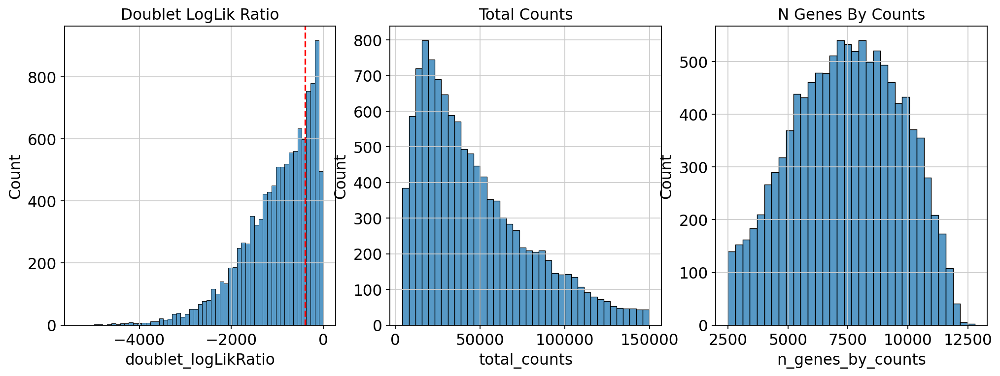

In [132]:
doublet_nll_cutoff = -400
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=False)

sns.histplot(ax=axes[0], x=cm_adata.obs['doublet_logLikRatio'])
axes[0].axvline(doublet_nll_cutoff, color='r', linestyle='--')
axes[0].set_title('Doublet LogLik Ratio')

sns.histplot(ax=axes[1], x=cm_adata.obs['total_counts'])
axes[1].set_title('Total Counts')

sns.histplot(ax=axes[2], x=cm_adata.obs['n_genes_by_counts'])
axes[2].set_title('N Genes By Counts')

In [133]:
cm_filt = cm_adata[cm_adata.obs['doublet_logLikRatio'] < doublet_nll_cutoff]

Text(0.5, 1.0, 'N Genes By Counts')

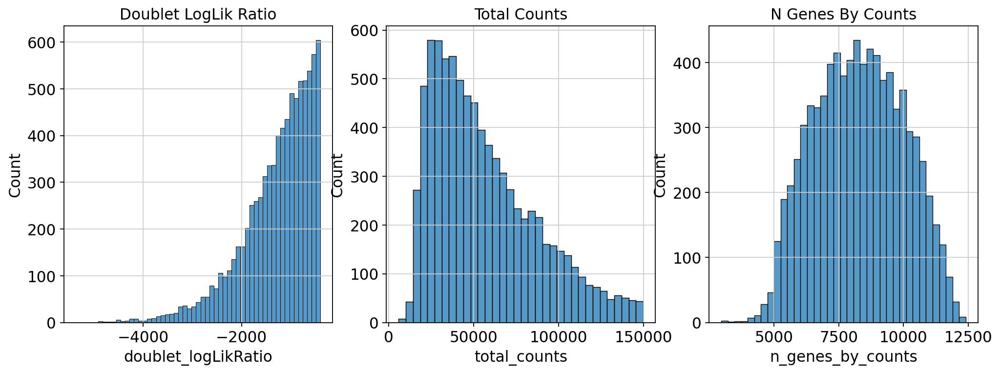

In [134]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=False)

sns.histplot(ax=axes[0], x=cm_filt.obs['doublet_logLikRatio'])
axes[0].set_title('Doublet LogLik Ratio')

sns.histplot(ax=axes[1], x=cm_filt.obs['total_counts'])
axes[1].set_title('Total Counts')

sns.histplot(ax=axes[2], x=cm_filt.obs['n_genes_by_counts'])
axes[2].set_title('N Genes By Counts')

#### Metrics related to cell viability

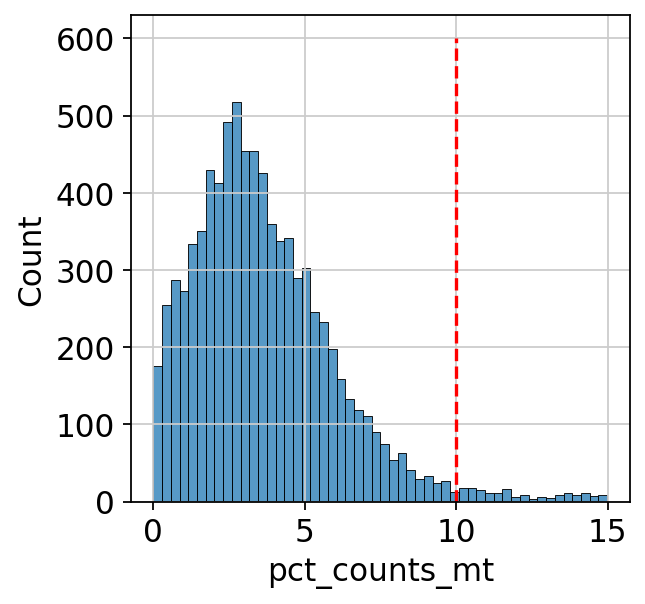

In [135]:
sns.histplot(cm_filt.obs['pct_counts_mt'])
plt.plot([10, 10], [0, 600], 'r--')

In [136]:
cm_filt = cm_filt[cm_filt.obs['pct_counts_mt'] < 10]

#### Metrics related to expression patterns

In [137]:
sc.pp.highly_variable_genes(cm_filt, layer='counts', n_top_genes=1000, flavor='seurat_v3', subset=False)
cm_filt.X = cm_filt.layers['data']
sc.pp.scale(cm_filt)
cm_filt.layers['scaled'] = cm_filt.X
sc.tl.score_genes(cm_filt, gene_list=cardiomyocyte_genes, score_name='cm_score')
sc.tl.score_genes_cell_cycle(cm_filt, s_genes=s_genes, g2m_genes=g2m_genes)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/contextlib.py:126: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'cm_score'
    finished: added
    'cm_score', score of gene set (adata.obs).
    450 total control genes are used. (0:00:01)
calculating cell cycle phase
computing score 'S_score'


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'S_score', score of gene set (adata.obs).
    729 total control genes are used. (0:00:01)
computing score 'G2M_score'


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'G2M_score', score of gene set (adata.obs).
    730 total control genes are used. (0:00:01)
-->     'phase', cell cycle phase (adata.obs)


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


Text(0.5, 1.0, 'G2M Score')

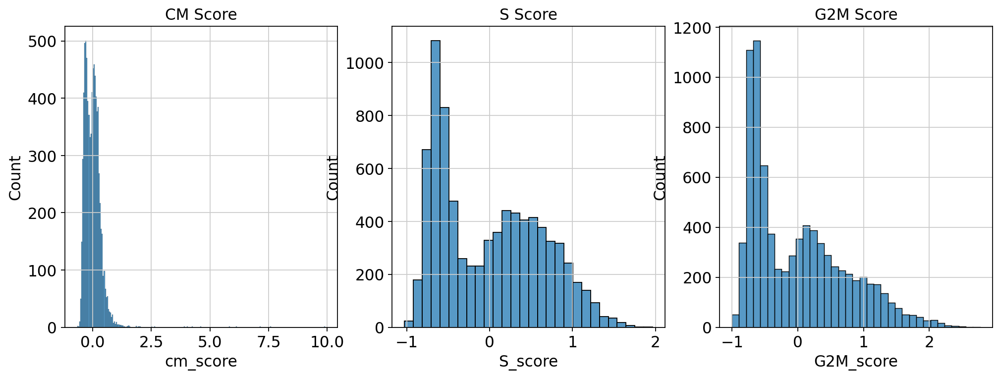

In [138]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=False)

sns.histplot(ax=axes[0], x=cm_filt.obs['cm_score'])
axes[0].set_title('CM Score')

sns.histplot(ax=axes[1], x=cm_filt.obs['S_score'])
axes[1].set_title('S Score')

sns.histplot(ax=axes[2], x=cm_filt.obs['G2M_score'])
axes[2].set_title('G2M Score')

#### Exploring expression patterns

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


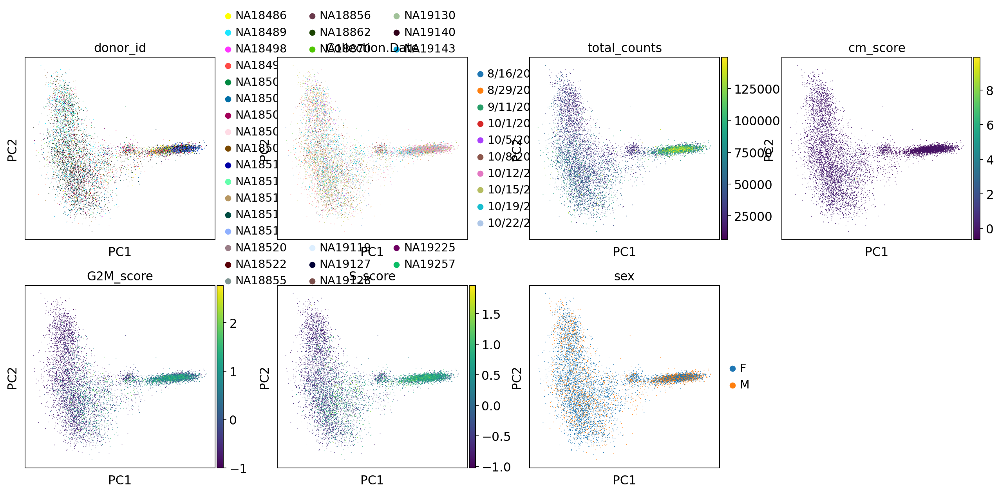

In [139]:
sc.pp.pca(cm_filt)
sc.pl.pca(cm_filt, color=['donor_id', 'Collection.Date', 'total_counts', 'cm_score', 'G2M_score', 'S_score', 'sex'],
         size=2.5, edgecolor='none')

There is certainly something strange going on here.

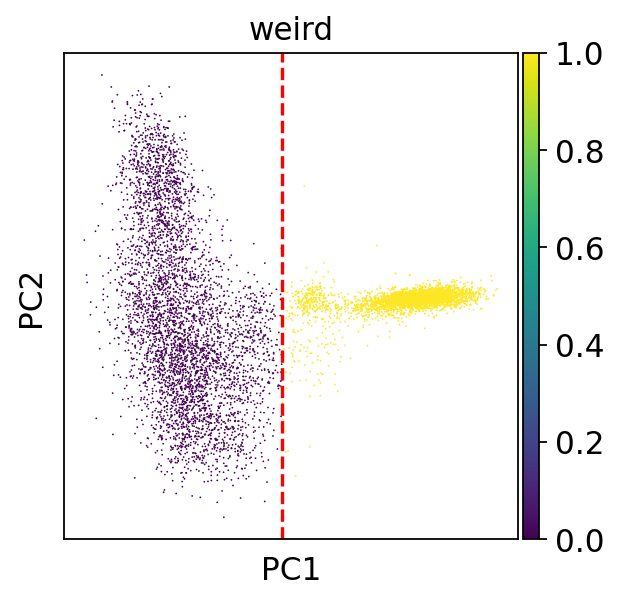

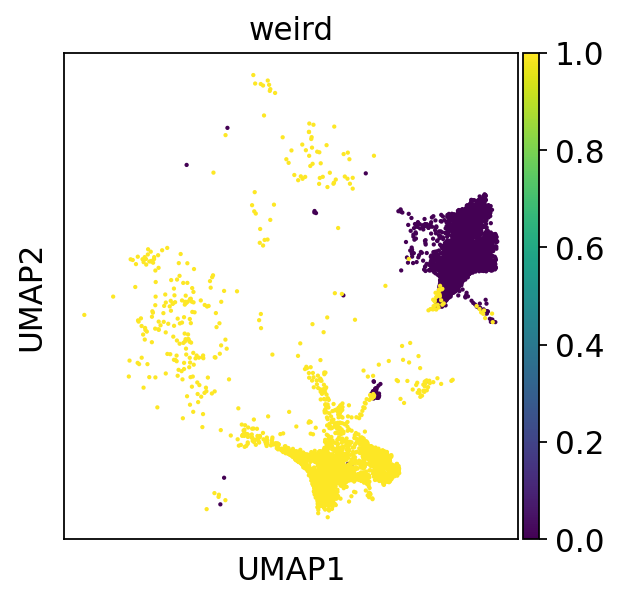

In [143]:
pc_cutoff = 0

pc1 = cm_filt.obsm['X_pca'][:, 0]
cm_filt.obs['weird'] = (pc1 > pc_cutoff).astype('int')

sc.pl.pca(cm_filt, color=['weird'], size=2.5, return_fig=True)
plt.axvline(pc_cutoff, color='r', linestyle='--')
cm_filt.obsm['X_umap'] = radhika_adata[cm_filt.obs.index].obsm['X_umap']
sc.pl.umap(cm_filt, color='weird')

Sure enough, none of those look remotely like cardiomyocytes. Double check that their scores reflect that

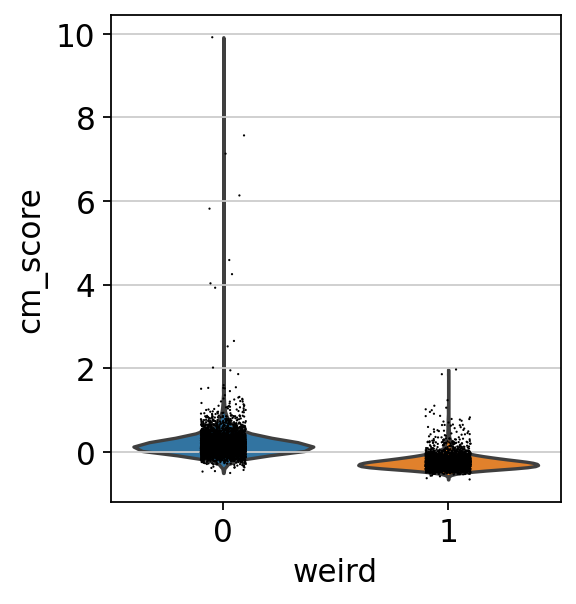

In [144]:
cm_filt.obs['weird'] = cm_filt.obs['weird'].astype('category')
sc.pl.violin(cm_filt, keys='cm_score', groupby='weird')

Those cells should be removed

In [145]:
cm_filt = cm_filt[pc1 <= pc_cutoff]

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


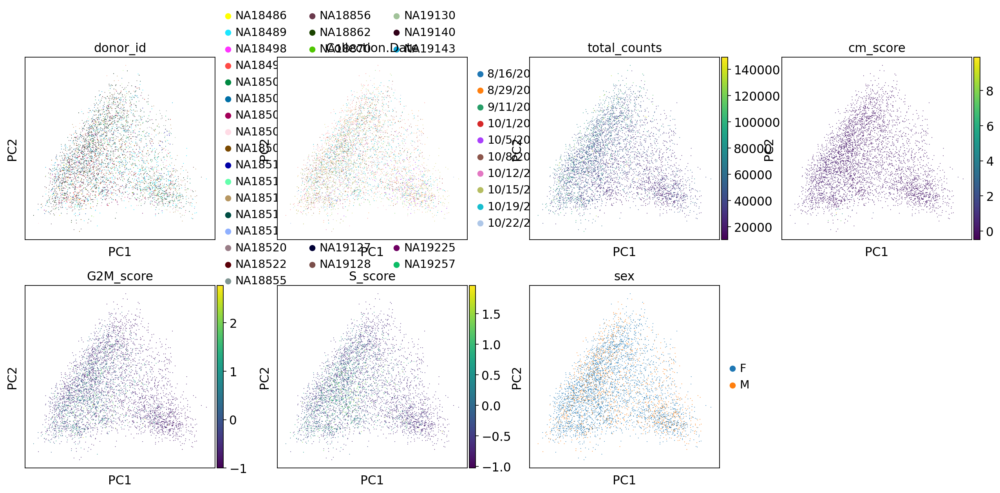

In [147]:
sc.pp.scale(cm_filt, layer='data')
cm_filt.layers['scaled'] = cm_filt.X
sc.pp.pca(cm_filt)
sc.pl.pca(cm_filt, color=['donor_id', 'Collection.Date', 'total_counts', 'cm_score', 'G2M_score', 'S_score', 'sex'],
         size=2.5, edgecolor='none')

/tmp/jobs/23172908/ipykernel_209754/2217238916.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_pd['intercept'] = 1
/tmp/jobs/23172908/ipykernel_209754/2217238916.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_pd['intercept'] = 1
/tmp/jobs/23172908/ipykernel_209754/2217238916.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pan

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5]),
 [Text(0, 0.5, 'donor_id'),
  Text(0, 1.5, 'Collection.Date'),
  Text(0, 2.5, 'total_counts'),
  Text(0, 3.5, 'cm_score'),
  Text(0, 4.5, 'G2M_score'),
  Text(0, 5.5, 'S_score'),
  Text(0, 6.5, 'sex')])

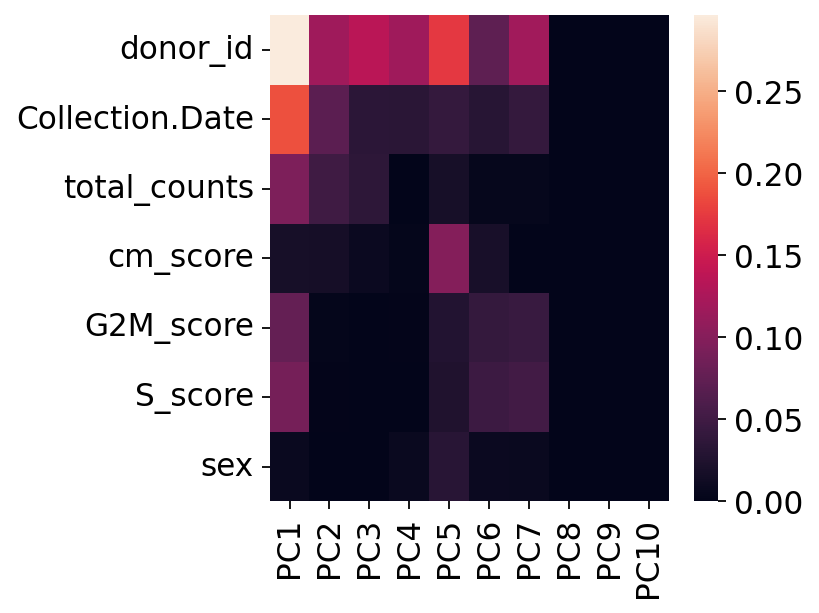

In [148]:
covariates = ['donor_id', 'Collection.Date', 'total_counts', 'cm_score', 'G2M_score', 'S_score', 'sex']
mat = np.zeros([len(covariates), 10])
for k in range(len(covariates)):
    if cm_filt.obs[covariates[k]].dtype.name == 'category':
        X_pd = cm_filt.obs[[covariates[k]]]
        X_pd['intercept'] = 1
        X = OneHotEncoder().fit(X_pd).transform(X_pd)
    else:
        X_pd = cm_filt.obs[[covariates[k]]]
        X_pd['intercept'] = 1
        X = X_pd.to_numpy()
    for pc in range(len(covariates)):
        y = cm_filt.obsm['X_pca'][:, pc]
        r2 = LinearRegression().fit(X, y).score(X, y)
        mat[k, pc] = r2
sns.heatmap(mat,
            xticklabels=['PC' + str(i) for i in range(1, 11)],
            yticklabels=covariates)
plt.yticks(rotation=0)

#### Subset & save

In [149]:
cm_keepers = cm_filt.obs.index

In [150]:
cm_filt.write_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/highpass/cm_lineage2-cm.h5ad")

In [151]:
all_keepers = ipsc_keepers.union(mesendo_keepers).union(meso_keepers).union(cp_keepers).union(cm_keepers)

In [152]:
scran_adata_filt = scran_adata[all_keepers]

#### Exploring expression patterns

In [153]:
sc.pp.highly_variable_genes(scran_adata_filt, layer='counts', n_top_genes=1000, flavor='seurat_v3', subset=False)
scran_adata_filt.X = scran_adata_filt.layers['data']
sc.pp.scale(scran_adata_filt)
scran_adata_filt.layers['scaled'] = scran_adata_filt.X
sc.tl.score_genes(scran_adata_filt, gene_list=pluripotency_genes, score_name='pluripotency_score')
sc.tl.score_genes(scran_adata_filt, gene_list=cardiomyocyte_genes, score_name='cm_score')
sc.tl.score_genes_cell_cycle(scran_adata_filt, s_genes=s_genes, g2m_genes=g2m_genes)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/contextlib.py:126: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'pluripotency_score'


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'pluripotency_score', score of gene set (adata.obs).
    500 total control genes are used. (0:00:08)
computing score 'cm_score'


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'cm_score', score of gene set (adata.obs).
    698 total control genes are used. (0:00:08)
calculating cell cycle phase
computing score 'S_score'


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'S_score', score of gene set (adata.obs).
    557 total control genes are used. (0:00:08)
computing score 'G2M_score'


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'G2M_score', score of gene set (adata.obs).
    687 total control genes are used. (0:00:08)
-->     'phase', cell cycle phase (adata.obs)


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:06)


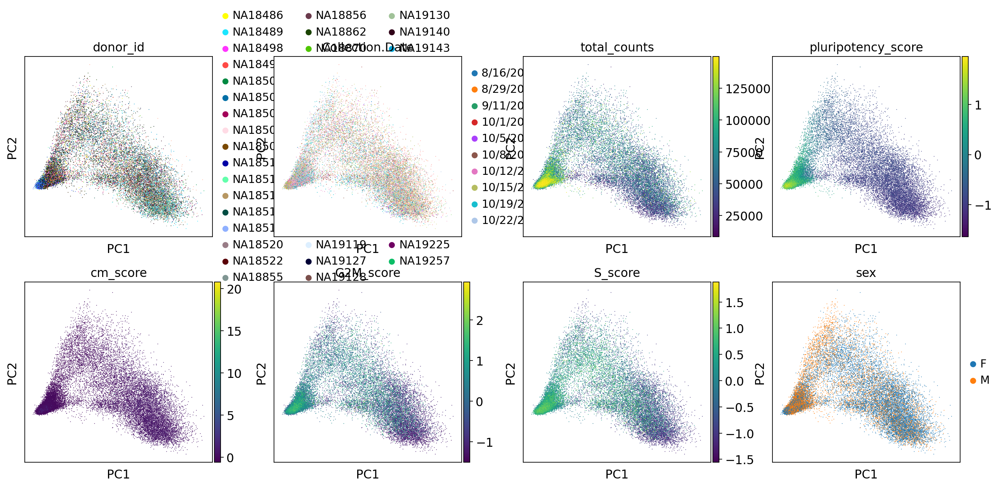

In [154]:
sc.pp.pca(scran_adata_filt)
sc.pl.pca(scran_adata_filt, color=['donor_id', 'Collection.Date', 'total_counts', 
                                   'pluripotency_score', 'cm_score', 'G2M_score', 'S_score', 'sex'],
         size=2.5, edgecolor='none')

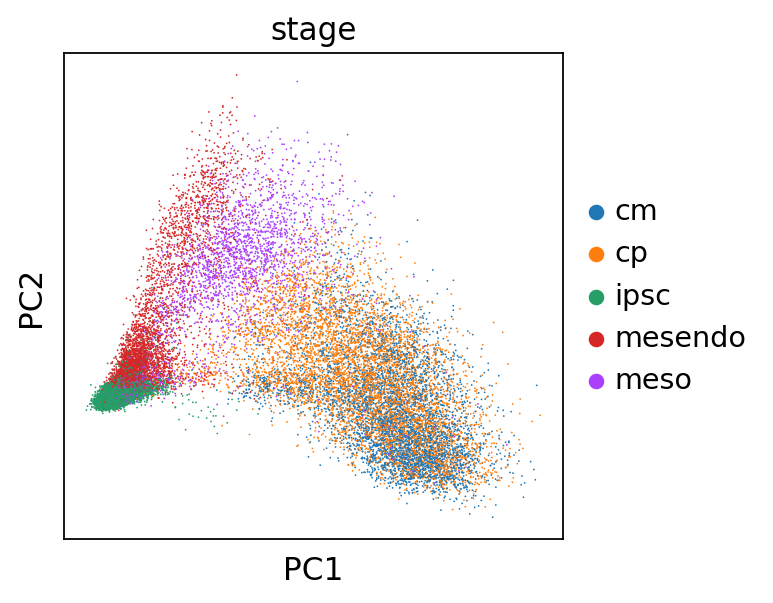

In [155]:
sc.pl.pca(scran_adata_filt, color=['stage'],
         size=2.5, edgecolor='none')

In [157]:
scran_adata_filt.obs['log_cm_score'] = np.log(scran_adata_filt.obs['cm_score']+1)

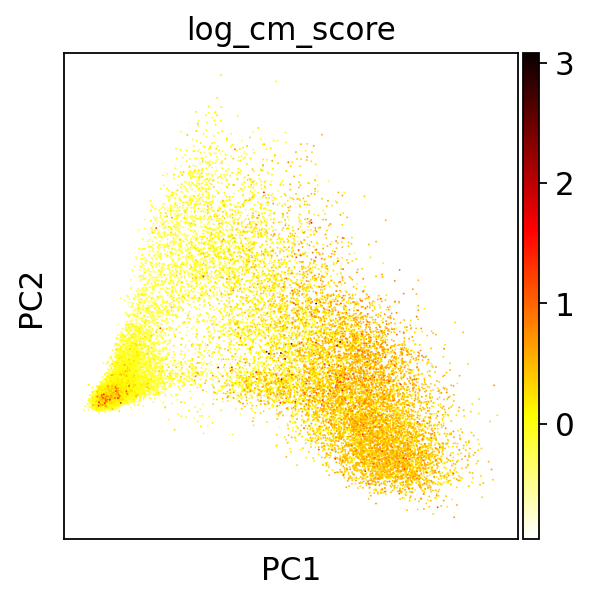

In [158]:
sc.pl.pca(scran_adata_filt, color=['log_cm_score'], color_map='hot_r')

#### Pseudotime inference

In [3]:
sc.pp.neighbors(scran_adata_filt)
sc.tl.diffmap(scran_adata_filt)
scran_adata_filt.uns['iroot'] = np.argmax(scran_adata_filt.X[:, list(scran_adata_filt.var_names).index("POU5F1")])
sc.tl.dpt(scran_adata_filt)

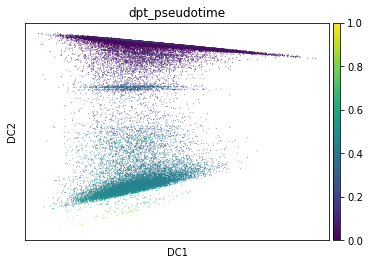

In [4]:
sc.pl.diffmap(scran_adata_filt, color='dpt_pseudotime')

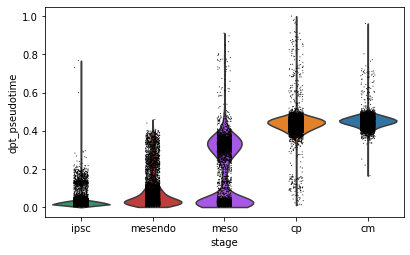

In [5]:
sc.pl.violin(scran_adata_filt, keys='dpt_pseudotime', groupby='stage', order=['ipsc', 'mesendo', 'meso', 'cp', 'cm'])

#### Subset & save

In [ ]:
scran_adata_filt.write_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/highpass/cm_lineage2.h5ad")

In [2]:
scran_adata_filt = sc.read_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/highpass/cm_lineage2.h5ad")

## Update summary tables

In [13]:
filtered_counts = adata.obs[['donor_id', 'cellid_label', 'total_counts']]
filtered_counts['n_cells_filtered'] = 1
filtered_counts['individual'] = [s.replace("NA", "") for s in filtered_counts['donor_id']]
filtered_counts['ind_type'] = filtered_counts['individual'].astype(str) + "_" + filtered_counts['cellid_label'].astype(str)
filtered_counts = filtered_counts.drop(columns=['donor_id', 'individual', 'cellid_label'])
filtered_counts = filtered_counts.groupby('ind_type').agg({'total_counts': 'sum', 'n_cells_filtered': 'count'})
filtered_counts = filtered_counts.reset_index().astype({'total_counts': 'int'})
filtered_counts

/tmp/jobs/25920387/ipykernel_14832/328849692.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_counts['n_cells_filtered'] = 1
/tmp/jobs/25920387/ipykernel_14832/328849692.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_counts['individual'] = [s.replace("NA", "") for s in filtered_counts['donor_id']]
/tmp/jobs/25920387/ipykernel_14832/328849692.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = va

,ind_type,total_counts,n_cells_filtered
0,18486_Acinar cells,18257891,759
1,18486_CNS glia,8493616,400
2,18486_CNS neurons,8388843,455
3,18486_Cardiomyocytes,3079749,82
4,18486_Ciliated epithelial cells,3688490,181
...,...,...,...
1404,19257_Squamous epithelial cells,3513640,86
1405,19257_Stellate cells,375348,14
1406,19257_Stromal cells,17843852,580
1407,19257_Ureteric bud cells,303244,10


In [14]:
cell_counts_filtered = cell_counts.merge(filtered_counts, on='ind_type', how='left').fillna({'total_counts': 0, 'n_cells_filtered': 0}).astype({'total_counts': 'int', 'n_cells_filtered': 'int'})
cell_counts_filtered['dropped'] = cell_counts_filtered['n_cells_filtered'] < 5
cell_counts_filtered = cell_counts_filtered.sort_values(by="n_cells_filtered", ascending=False)

In [15]:
cell_counts_filtered.to_csv("/project2/gilad/jpopp/ebQTL/data/static/eb_cellid/pseudobulk_tmm/sample_summary.tsv", sep="\t")

In [16]:
ind_counts = cell_counts_filtered[cell_counts_filtered['n_cells_filtered'] >= 5]
ind_counts = pd.DataFrame(ind_counts[['type']].value_counts()).reset_index(inplace=False).rename(columns={0: "n_filtered"})
ind_counts = ind_counts[ind_counts['n_filtered']>25]
ind_counts

,type,n_filtered
0,Acinar cells,53
1,CNS glia,53
2,CNS neurons,53
3,Ciliated epithelial cells,53
4,Erythroblasts,53
5,Metanephric cells,53
6,Retinal cells,52
7,Ductal cells,52
8,PNS glia,52
9,Neuroendocrine cells,52


In [17]:
ind_counts.to_csv("/project2/gilad/jpopp/ebQTL/data/static/eb_cellid/pseudobulk_tmm/samples_per_celltype.tsv",
                  sep="\t", index=False)

## Aggregation

### Aggregate raw counts

In [18]:
cell_subset = adata.obs[['donor_id']]
cell_subset['type'] = adata.obs[['cellid_label']]
cell_subset['ind'] = [s.replace("NA", "") for s in cell_subset['donor_id'].astype(str)]
cell_subset['sample'] = cell_subset['ind'] + "_" + cell_subset['type']
onehot = OneHotEncoder(sparse=True).fit_transform(cell_subset[['sample']])
onehot

/tmp/jobs/25920387/ipykernel_14832/344384433.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cell_subset['type'] = adata.obs[['cellid_label']]
/tmp/jobs/25920387/ipykernel_14832/344384433.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cell_subset['ind'] = [s.replace("NA", "") for s in cell_subset['donor_id'].astype(str)]
/tmp/jobs/25920387/ipykernel_14832/344384433.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexe

<537276x1409 sparse matrix of type '<class 'numpy.float64'>'
	with 537276 stored elements in Compressed Sparse Row format>

In [19]:
pseudobulk_sum = adata.layers['counts'].transpose() * onehot

In [30]:
pseudobulk_sum = pd.DataFrame.sparse.from_spmatrix(data=pseudobulk_sum, index=adata.var_names, columns=cell_subset['sample'].astype("category").cat.categories)

In [31]:
pseudobulk_sum.to_csv("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/eb_cellid.pseudobulk_tmm.tsv",
                       sep="\t", index_label="gene")

### Aggregate scran-normalized counts

I didn't run this while finalizing how to normalize

In [170]:
#n_cells = onehot.sum(axis=0)
#pseudobulk_sum_norm = scran_adata_filt.layers['data'].transpose() * onehot
#pseudobulk_mean_norm = pseudobulk_sum_norm / n_cells

In [171]:
#pseudobulk_mean_norm = pd.DataFrame(pseudobulk_mean_norm, 
                                    #index=scran_adata_filt.var_names, columns=cell_subset['sample'].astype("category").cat.categories)

In [172]:
#pseudobulk_mean_norm.to_csv("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/cm_lineage2.pseudobulk_scran.tsv",
                       #sep="\t", index_label="gene")